# 1. Getting VizDoom Up and Running

In [1]:
!pip install vizdoom

# remember to move the basic.cfg and basic.wad to the content directory
# change window_visible = true to false in .cfg

In [2]:
!cd github & git clone https://github.com/mwydmuch/ViZDoom

zsh:cd:1: no such file or directory: github
fatal: destination path 'ViZDoom' already exists and is not an empty directory.


In [7]:
# Import vizdoom for game env
from vizdoom import *
# Import random for action sampling
import random
# Import time for sleeping
import time
# Import numpy for identity matrix
import numpy as np

In [8]:
# Setup game
game = DoomGame()
game.set_window_visible(False)
game.load_config('basic.cfg')
game.init()

In [9]:
# This is the set of actions we can take in the environment
actions = np.identity(3, dtype=np.uint8)

In [10]:
state = game.get_state()

In [11]:
state.game_variables

array([50.])

In [ ]:
# # Loop through episodes
# episodes = 10
# for episode in range(episodes):
#     # Create a new episode or game
#     game.new_episode()
#     # Check the game isn't done
#     while not game.is_episode_finished():
#         # Get the game state
#         state = game.get_state()
#         print("State shape:", state.screen_buffer.shape)
#         # Get the game image
#         img = state.screen_buffer
#         # Get the game variables - ammo
#         info = state.game_variables
#         # Take an action
#         reward = game.make_action(random.choice(actions),4)
#         # Print rewward
#         print('reward:', reward)
#         time.sleep(0.02)
#     print('Result:', game.get_total_reward())
#     time.sleep(2)

In [12]:
game.close()

# 2. Converting it to a Gym Environment

In [13]:
!pip install gym

In [14]:
# Import environment base class from OpenAI Gym
from gym import Env
# Import gym spaces
from gym.spaces import Discrete, Box
# Import opencv
import cv2

In [15]:
# game.get_state().screen_buffer.shape

In [16]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Fri Jan 25 09:55:24 2019

@author: edward
"""
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch import nn

from torch.distributions import Categorical
import torch.nn.functional as F
# from arguments import parse_a2c_args

class Lin_View(nn.Module):
	def __init__(self):
		super(Lin_View, self).__init__()

	def forward(self, x):
		return x.view(x.size()[0], -1)


class CNNPolicy(nn.Module):
    def __init__(self, input_shape, args):
        super(CNNPolicy, self).__init__()

        self.conv_head = nn.Sequential(nn.Conv2d(3, args['conv1_size'], 8, stride=4),
                                        nn.ReLU(True),
                                        nn.Conv2d(args['conv1_size'], args['conv2_size'], 4, stride=2),
                                        nn.ReLU(True),
                                        nn.Conv2d(args['conv2_size'], args['conv3_size'], 3, stride=1),
                                        nn.ReLU(True))

        conv_input = torch.Tensor(torch.randn((1,) + input_shape))
        print(conv_input.size(), self.conv_head(conv_input).size(), self.conv_head(conv_input).size())
        self.conv_out_size = self.conv_head(conv_input).nelement()
        self.hidden_size = args['hidden_size']

        self.linear1 = nn.Linear(self.conv_out_size, self.hidden_size)
        self.gru = nn.GRUCell(self.hidden_size, self.hidden_size)


        self.critic_linear = nn.Linear(self.hidden_size, 1)
        self.dist_linear = nn.Linear(self.hidden_size, args['num_actions'])

        self.args = args
        self.train()
        self.apply(self.initialize_weights)
        self.apply_gain()

    def apply_gain(self):
        relu_gain = nn.init.calculate_gain('relu')
        for i in range(0, 6, 2):
            self.conv_head[i].weight.data.mul_(relu_gain)
        self.linear1.weight.data.mul_(relu_gain)


    def forward(self, obs, states, masks):
        # obs = obs['observation']
        x = self.conv_head(obs*(1.0/255.0))
        batch_size = x.size(0)
        conv_out_size = x.view(batch_size, -1).size(1)
        x = x.view(-1, self.conv_out_size)
        x = self.linear1(x)
        x = F.relu(x)
        x = new_states = self.gru(x, states*masks.clone())

        values = self.critic_linear(x)
        log_probs = F.log_softmax(self.dist_linear(x), dim=1)

        dist = Categorical(logits=log_probs)

        if self.training:
            actions = dist.sample()
        else:
            _, actions = dist.probs.max(1)
        action_log_probs = dist.log_prob(actions)
        entropy = dist.entropy()

        # state, actions, action log_probs, entropy, value estimates
        result = {'states': new_states,
                  'actions': actions,
                  'action_log_probs': action_log_probs,
                  'entropy': entropy,
                  'values': values}

        return result

    @staticmethod
    def initialize_weights(layer):
        if type(layer) == nn.Conv2d or type(layer) == nn.Linear:
            nn.init.orthogonal_(layer.weight.data, gain=1)
            layer.bias.data.fill_(0)
        elif type(layer) == nn.GRUCell:
            nn.init.orthogonal_(layer.weight_ih, gain=1)
            nn.init.orthogonal_(layer.weight_hh, gain=1)
            layer.bias_ih.data.fill_(0)
            layer.bias_hh.data.fill_(0)
        else:
            pass



# if __name__ == '__main__':
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

args = {
      'conv1_size': 16,       # Filters in the first convolutional layer
      'conv2_size': 32,       # Filters in the second convolutional layer
      'conv3_size': 16,        # Output should have 3 channels (RGB)
      'hidden_size': 128,     # For GRU and fully connected layers (not used for resizing)
      'num_actions': 3      # For RL actions (not used for resizing)
}

#     args = parse_a2c_args()
    # args.num_actions = 5
shape = (3,64,112)
model = CNNPolicy(shape, args)

# inp = {'observation': torch.randn(2,3,64,112)}
state_global = torch.randn(2,128)
mask = torch.ones(2,1)
state_global = torch.zeros(1, args['hidden_size']).to(device)
mask_global = torch.ones(1,1).to(device)



# result = model(inp, state, mask)

# print('state', result['states'].size())
# print('actions', result['actions'].size())
# print('entropy', result['entropy'].size())
# print('action_log_probs', result['action_log_probs'].size())
# print('values', result['values'].size())


torch.Size([1, 3, 64, 112]) torch.Size([1, 16, 4, 10]) torch.Size([1, 16, 4, 10])


In [17]:
# Create Vizdoom OpenAI Gym Environment
def resize_observation_with_conv(observation):
    """
    Resizes a single observation from either (C, H, W) or (H, W, C) to (3, 64, 112) using convolutional layers.

    Args:
        observation (numpy.ndarray or torch.Tensor): Input in (H, W, C) or (C, H, W).

    Returns:
        numpy.ndarray: Resized observation in (64, 112, 3).
    """
    # Define the convolutional layers
    # plt.imshow(cv2.cvtColor(state, cv2.COLOR_BGR2RGB))

    conv = nn.Sequential(

        nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),  # (3, 480, 640) -> (16, 240, 320)
        nn.ReLU(),
        nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),  # (16, 240, 320) -> (32, 120, 160)
        nn.ReLU(),
        nn.Conv2d(32, 3, kernel_size=3, stride=2, padding=1),  # (32, 120, 160) -> (3, 60, 80)
        nn.Upsample(size=(64, 112), mode="bilinear", align_corners=False),  # (3, 60, 80) -> (3, 64, 112)
    )

    # Handle both (H, W, C) and (C, H, W) formats
    if isinstance(observation, np.ndarray):  # Convert NumPy to PyTorch
        if observation.shape[0] == 3:  # Already in (C, H, W)
            observation = torch.tensor(observation, dtype=torch.float32)
        elif observation.shape[-1] == 3:  # Convert from (H, W, C) -> (C, H, W)
            observation = torch.tensor(observation, dtype=torch.float32).permute(2, 0, 1)
        else:
            raise ValueError(f"Unexpected observation shape: {observation.shape}")
    elif isinstance(observation, torch.Tensor):
        if observation.shape[0] != 3:
            raise ValueError(f"Expected tensor with 3 channels, got {observation.shape}")

    # Add batch dimension to match convolutional layer input requirements
    observation = observation.unsqueeze(0)  # Shape: (1, C, H, W)

    # Apply the convolutional layers
    resized_observation = conv(observation)

    # Remove batch dimension and convert back to NumPy array
    resized_observation = resized_observation.squeeze(0).permute(1, 2, 0).detach().numpy()  # (1, C, H, W) -> (H, W, C)

    return resized_observation.astype(np.uint8)

import torch
import torch.nn.functional as F

import cv2
import numpy as np

def resize_observation_bicubic(observation):
    """
    Resizes an observation from (3, 480, 640) to (3, 64, 112) using bicubic interpolation.

    Args:
        observation (numpy.ndarray): Input array of shape (3, 480, 640).

    Returns:
        numpy.ndarray: Resized array of shape (3, 64, 112).
    """
    if not isinstance(observation, np.ndarray):
        raise TypeError("Input observation must be a NumPy array.")

    if observation.shape != (3, 480, 640):
        raise ValueError(f"Expected input shape (3, 480, 640), got {observation.shape}")

    # Resize each channel individually
    resized_channels = [
        cv2.resize(observation[i], (112, 64), interpolation=cv2.INTER_CUBIC) for i in range(3)
    ]

    # Stack channels back together
    resized_observation = np.stack(resized_channels, axis=0)  # Shape: (3, 64, 112)
    resized_observation = np.transpose(resized_observation, (1, 2, 0))  # (64, 112, 3)

    return resized_observation

class VizDoomGym(Env):
    # Function that is called when we start the env
    def __init__(self, render=False):
        # Inherit from Env
        super().__init__()
        # Setup the game
        self.game = DoomGame()
        self.game.set_window_visible(False)
        self.game.load_config('basic.cfg')

        # Render frame logic
        if render == False:
            self.game.set_window_visible(False)
        else:
            self.game.set_window_visible(True)

        # Start the game
        self.game.init()

        # Create the action space and observation space
        self.observation_space = Box(low=0, high=255, shape=(64,112,3), dtype=np.uint8)
        print(f"observation space is {self.observation_space}")
        self.action_space = Discrete(3)

    # This is how we take a step in the environment
    def step(self, action):
        # Specify action and take step
        actions = np.identity(3)
        reward = self.game.make_action(actions[action], 4)

        # Get all the other stuff we need to retun
        if self.game.get_state():
            state = self.game.get_state().screen_buffer
            # state = self.grayscale(state)
            # state = resize_observation_bicubic(state)
            state = resize_observation_with_conv(state)
            # state= torch.from_numpy(state)
            # state = model(state, state_global, mask)
            # state= state.numpy()
            print(self.game.get_state().game_variables)
            ammo = self.game.get_state().game_variables[0]
            info = ammo
        else:
            state = np.zeros(self.observation_space.shape)
            info = 0

        info = {"info":info}
        done = self.game.is_episode_finished()

        return state, reward, done, info

    # Define how to render the game or environment
    def render():
        pass

    # What happens when we start a new game
    def reset(self):
        self.game.new_episode()
        state = self.game.get_state().screen_buffer
        # return resize_observation_bicubic(state)
        # state= torch.from_numpy(state)
        # state = model(state, state_global, mask)
        # return state.numpy()
        return resize_observation_with_conv(state)
        # return self.grayscale(state)

    # Grayscale the game frame and resize it
    def grayscale(self, observation):
        print(observation.shape)
        gray = cv2.cvtColor(np.moveaxis(observation, 0, -1), cv2.COLOR_BGR2GRAY)
        resize = cv2.resize(gray, (112,64), interpolation=cv2.INTER_CUBIC)
        state = np.reshape(resize, (64,112,1))
        return state
    # def grayscale(self, observation):
    # # Ensure the observation has the correct dimensions
    #   if observation.shape[-1] == 3:  # Check if the last dimension is RGB channels
    #       # Convert RGB to grayscale
    #       gray = cv2.cvtColor(observation, cv2.COLOR_BGR2GRAY)
    #   else:
    #       raise ValueError(f"Unexpected observation shape: {observation.shape}")

    #   # Resize the grayscale image to the target size
    #   resized = cv2.resize(gray, (160, 100), interpolation=cv2.INTER_CUBIC)

    #   # Add a channel dimension to make it (100, 160, 1)
    #   state = np.expand_dims(resized, axis=-1)

    #   return state

    # Call to close down the game
    def close(self):
        self.game.close()

In [18]:
env = VizDoomGym(render=False)

observation space is Box(0, 255, (64, 112, 3), uint8)


In [19]:
state = env.reset()
state.shape

(64, 112, 3)

# 3. View Game State

In [20]:
env.reset()

array([[[  0, 251,   4],
        [  0, 251,   3],
        [  0, 251,   2],
        ...,
        [  0, 251,   2],
        [  0, 250,   2],
        [255, 249,   3]],

       [[  0, 255,   4],
        [  1, 255,   4],
        [  0, 254,   3],
        ...,
        [  0, 254,   2],
        [  0, 254,   1],
        [  0, 254,   1]],

       [[  0, 254,   3],
        [  1, 252,   2],
        [  1, 251,   2],
        ...,
        [  1, 252,   2],
        [  1, 252,   2],
        [  1, 252,   1]],

       ...,

       [[  0,   0,  12],
        [  0, 255,   9],
        [  1, 253,   7],
        ...,
        [  4,   1,   1],
        [  3,   1,   4],
        [  1,   0,   7]],

       [[  1, 254,   4],
        [  1, 253,   3],
        [  1, 252,   4],
        ...,
        [  7,   1,   3],
        [  2,   2,   5],
        [255,   0,   7]],

       [[  1,   0,   2],
        [  1, 255,   2],
        [  1,   0,   3],
        ...,
        [  6,   1,   4],
        [  2,   0,   5],
        [  0,   1,   4]]

In [68]:
env.close()

In [22]:
# Import Environment checker
!pip install stable-baselines3
from stable_baselines3.common import env_checker

In [20]:
# env_checker.check_env(env)

# 3. View State

In [23]:
!pip install matplotlib shimmy

In [24]:
from matplotlib import pyplot as plt

[[[  3 254 255]
  [  3 254   3]
  [  3 254   5]
  ...
  [  4 254   4]
  [  3 254   4]
  [  1 255   3]]

 [[255   4 250]
  [255   1 253]
  [255   0 255]
  ...
  [255   1 253]
  [254   1 253]
  [254   0 254]]

 [[  1   1 254]
  [  0   2 255]
  [  0   2 255]
  ...
  [  0   0 255]
  [  0   0   0]
  [  1   0   0]]

 ...

 [[254   5 247]
  [249   1 248]
  [246 254 249]
  ...
  [238 252 254]
  [245 255 253]
  [252   0 251]]

 [[255   6 249]
  [253   3 251]
  [253   2 251]
  ...
  [235 247   4]
  [244 249   1]
  [254 255 253]]

 [[255   5 250]
  [254   4 250]
  [252   4 248]
  ...
  [250   1 251]
  [251   0 252]
  [250   0 252]]]


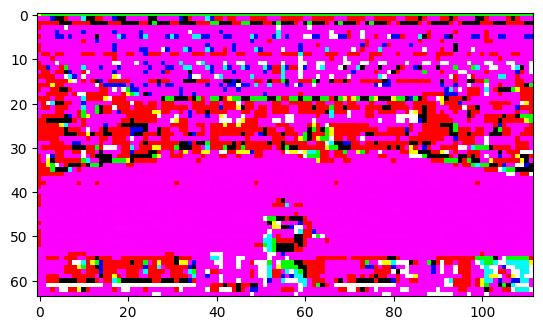

In [25]:
# state = np.transpose(state, (1, 2, 0))
print(state)
plt.imshow(cv2.cvtColor(state, cv2.COLOR_BGR2RGB))

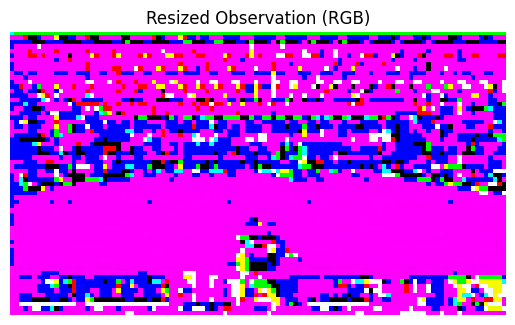

In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Simulate a resized observation (C, H, W)
# state = np.random.randint(0, 255, (3, 64, 112), dtype=np.uint8)

# Convert from (C, H, W) to (H, W, C)
# state = np.transpose(state, (1, 2, 0))  # (64, 112, 3)

# Plot directly if the image is already in RGB
plt.imshow(state)
plt.axis("off")
plt.title("Resized Observation (RGB)")
plt.show()


# 4. Setup Callback

In [27]:
!pip install torch==1.10.1+cu113 torchvision==0.11.2+cu113 torchaudio===0.10.1+cu113 -f https://download.pytorch.org/whl/cu113/torch_stable.html

Looking in links: https://download.pytorch.org/whl/cu113/torch_stable.html
ERROR: Could not find a version that satisfies the requirement torch==1.10.1+cu113 (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1)
ERROR: No matching distribution found for torch==1.10.1+cu113


In [28]:
!pip install stable-baselines3[extra]

zsh:1: no matches found: stable-baselines3[extra]


In [29]:
# Import os for file nav
import os
# Import callback class from sb3
from stable_baselines3.common.callbacks import BaseCallback

In [31]:
import os
import numpy as np
from stable_baselines3.common.callbacks import BaseCallback


class TrainAndLoggingCallback(BaseCallback):
    def __init__(self, check_freq: int, save_path: str, log_dir: str, save_freq: int, verbose=1):
        """
        Combined callback for saving model checkpoints and logging data.

        :param check_freq: Frequency (in timesteps) to save the model.
        :param save_path: Directory to save the model checkpoints.
        :param log_dir: Directory to save the .npz files for logging data.
        :param save_freq: Frequency (in timesteps) to save the data logs.
        :param verbose: Verbosity level (0 = silent, 1 = info).
        """
        super(TrainAndLoggingCallback, self).__init__(verbose)
        self.check_freq = check_freq
        self.save_path = save_path
        self.log_dir = log_dir
        self.save_freq = save_freq

        self.data = {
            "observations": [],
            "actions": [],
            "rewards": [],
            "dones": [],
        }

        # Ensure directories exist
        os.makedirs(self.save_path, exist_ok=True)
        os.makedirs(self.log_dir, exist_ok=True)

    def _init_callback(self):
        if self.verbose > 0:
            print(f"Initialized callback with model save path: {self.save_path} and log directory: {self.log_dir}")

    def _on_step(self) -> bool:
        # Log data
        obs = self.locals["new_obs"]
        actions = self.locals["actions"]
        rewards = self.locals["rewards"]
        dones = self.locals["dones"]

        self.data["observations"].append(obs.copy())
        self.data["actions"].append(actions)
        self.data["rewards"].append(rewards)
        self.data["dones"].append(dones)
        # data=np.array(self.data["observations"])
        # data=data.squeeze(axis=1)
        # self.data["observations"]=data.tolist()
        # data=np.array(self.data["actions"])
        # data=data.reshape(-1)
        # self.data["actions"]=data.tolist()
        # data=np.array(self.data["rewards"])
        # data=data.reshape(-1)
        # self.data["rewards"]=data.tolist()
        # data=np.array(self.data["dones"])
        # data=data.reshape(-1)
        # self.data["dones"]=data.tolist()


        # Save data periodically
        # Save model checkpoint periodically
        if self.n_calls % self.check_freq == 0:
            model_path = os.path.join(self.save_path, f'best_model_{self.n_calls}')
            self.model.save(model_path)
            if self.verbose > 0:
                print(f"Saved model checkpoint to {model_path}")

        # Save log data periodically
        if self.n_calls % self.save_freq == 0:
            self._save_data()

        return True

    def _on_training_end(self):
        # Save data at the end of training
        self._save_data()

    def _save_data(self):
        # Save data as .npz file
        file_path = os.path.join(self.log_dir, f"log_data_{ int((self.n_calls /90)-1)}.npz")
        data=np.array(self.data["observations"])
        data=data.squeeze(axis=1)
        self.data["observations"]=data.tolist()
        data=np.array(self.data["actions"])
        data=data.reshape(-1)
        self.data["actions"]=data.tolist()
        data=np.array(self.data["rewards"])
        data=data.reshape(-1)
        self.data["rewards"]=data.tolist()
        data=np.array(self.data["dones"])
        data=data.reshape(-1)
        self.data["dones"]=data.tolist()
        # self.data.shape
        np.savez(file_path, **self.data)
        if self.verbose > 0:
            print(f"Saved log data to {file_path}")

        # Clear the data to avoid excessive memory usage
        self.data = {
            "observations": [],
            "actions": [],
            "rewards": [],
            "dones": [],
        }

In [32]:
CHECKPOINT_DIR = './train/train_basic'
LOG_DIR = './logs/log_basic'

In [33]:
callback = TrainAndLoggingCallback(check_freq=45000, save_path=CHECKPOINT_DIR, log_dir=LOG_DIR, save_freq=90)

# 5. Train Model

In [34]:
# import ppo for training

from stable_baselines3 import PPO
# game.get_state().game_variables[0]

In [49]:
# Non rendered environment
env = VizDoomGym()
# env.get_state().game_variables[0]

observation space is Box(0, 255, (64, 112, 3), uint8)


In [50]:

model = PPO('CnnPolicy', env, tensorboard_log=LOG_DIR, learning_rate=0.0001, n_steps=2048)

In [51]:
model.learn(total_timesteps=1000000, callback=callback)

Initialized callback with model save path: ./train/train_basic and log directory: ./logs/log_basic
[50.]
[49.]
[49.]
[49.]
[48.]
[48.]
[48.]
[48.]
[48.]
[47.]
[47.]
[47.]
[47.]
[47.]
[47.]
[47.]
[46.]
[46.]
[46.]
[46.]
[46.]
[46.]
[46.]
[45.]
[45.]
[45.]
[44.]
[44.]
[44.]
[44.]
[44.]
[43.]
[43.]
[43.]
[43.]
[43.]
[42.]
[42.]
[42.]
[41.]
[41.]
[41.]
[41.]
[41.]
[41.]
[41.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[39.]
[39.]
[39.]
[39.]
[39.]
[38.]
[38.]
[38.]
[37.]
[37.]
[37.]
[37.]
[37.]
[37.]
[36.]
[36.]
[36.]
[36.]
[35.]
[50.]
[50.]
[49.]
[49.]
[49.]
[49.]
[49.]
[49.]
[49.]
[48.]
[48.]
[48.]
[47.]
Saved log data to ./logs/log_basic/log_data_1115.npz
[47.]
[47.]
[47.]
[47.]
[46.]
[46.]
[46.]
[46.]
[46.]
[46.]
[46.]
[46.]
[46.]
[45.]
[45.]
[45.]
[45.]
[44.]
[44.]
[44.]
[44.]
[43.]
[43.]
[43.]
[42.]
[42.]
[42.]
[42.]
[42.]
[41.]
[41.]
[41.]
[41.]
[41.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[40.]
[39.]
[39.]
[39.]
[39.]
[39.]
[38.]
[38.]
[38.]
[37.]
[37.]
[37.]
[37.]
[3

KeyboardInterrupt: 

In [38]:
import os
import numpy as np
from collections import defaultdict

# Define the directory where the files are located
# log_dir = "/content/logs/log_basic/"
log_dir = "logs/log_basic"
!pwd

# List all .npz files in the directory and sort them by name
log_files = sorted([f for f in os.listdir(log_dir) if f.endswith('.npz')])

# Dictionary to store the total tensor count for each shape
key_shapes_total = defaultdict(lambda: defaultdict(int))  # {key: {shape: total_count}}

# Loop through all files and collect tensor counts and shapes
for file in log_files:
    file_path = os.path.join(log_dir, file)
    print(f"Processing file: {file}")

    # Load the .npz file
    data = np.load(file_path)

    # Record the shapes and counts for each key
    for key in data.files:
        tensor = data[key]
        shape = tensor.shape
        count = shape[0]  # Number of tensors in the first dimension
        key_shapes_total[key][shape] += count

# Generate a report
print("\n--- Total Tensor Count Report ---\n")
for key, shape_counts in key_shapes_total.items():
    print(f"Key: {key}")
    if len(shape_counts) == 1:
        # All shapes match
        shape, total_count = next(iter(shape_counts.items()))
        print(f"  All tensors have the same shape: {shape} (Total count: {total_count})")
    else:
        # There are mismatched shapes
        print(f"  Shapes do not match. Found {len(shape_counts)} unique shapes:")
        for shape, total_count in shape_counts.items():
            print(f"    Shape: {shape}, Total tensors: {total_count}")
        print(f"  Array of all unique shapes: {list(shape_counts.keys())}")


/Users/karman/Desktop/projects/vizdoom_ppo/DoomReinforcementLearning
Processing file: log_data_0.npz
Processing file: log_data_1.npz
Processing file: log_data_10.npz
Processing file: log_data_100.npz
Processing file: log_data_1000.npz
Processing file: log_data_1001.npz
Processing file: log_data_1002.npz
Processing file: log_data_1003.npz
Processing file: log_data_1004.npz
Processing file: log_data_1005.npz
Processing file: log_data_1006.npz
Processing file: log_data_1007.npz
Processing file: log_data_1008.npz
Processing file: log_data_1009.npz
Processing file: log_data_101.npz
Processing file: log_data_1010.npz
Processing file: log_data_1011.npz
Processing file: log_data_1012.npz
Processing file: log_data_1013.npz
Processing file: log_data_1014.npz
Processing file: log_data_1015.npz
Processing file: log_data_1016.npz
Processing file: log_data_1017.npz
Processing file: log_data_1018.npz
Processing file: log_data_1019.npz
Processing file: log_data_102.npz
Processing file: log_data_1020.n

# 6. Test the Model

In [39]:
# Import eval policy to test agent
from stable_baselines3.common.evaluation import evaluate_policy

In [64]:
# Reload model from disc
model = PPO.load('./train/train_basic/best_model_135000')

In [69]:
# Create rendered environment
env = VizDoomGym(render=True)

2025-01-26 17:12:33.551 vizdoom[23782:10311558] +[IMKClient subclass]: chose IMKClient_Modern
2025-01-26 17:12:33.551 vizdoom[23782:10311558] +[IMKInputSession subclass]: chose IMKInputSession_Modern


observation space is Box(0, 255, (64, 112, 3), uint8)


In [70]:
# Evaluate mean reward for 10 games
mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=10)

/Users/karman/.pyenv/versions/3.10.0/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/karman/.pyenv/versions/3.10.0/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.]
[50.

In [46]:
mean_reward

-97.46

In [ ]:
model.predict(obs)

In [ ]:
for episode in range(100):
    obs = env.reset()
    done = False
    total_reward = 0
    while not done:
        action, _ = model.predict(obs)
        obs, reward, done, info = env.step(action)
        # time.sleep(0.20)
        total_reward += reward
    print('Total Reward for episode {} is {}'.format(total_reward, episode))
    time.sleep(2)